In [1]:
%%HTML
<script src="require.js"></script>

In [2]:
from IPython.display import HTML
HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script><script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
} else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>
''')

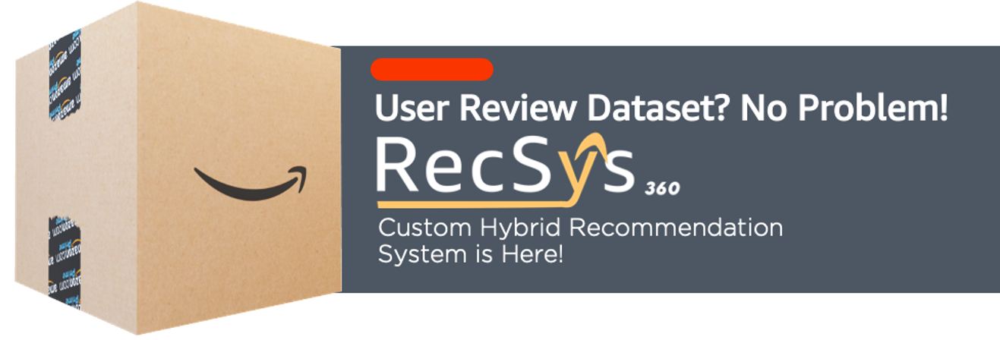

<a id='ExecSum'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">EXECUTIVE SUMMARY</h1>

This report presents the development of a custom hybrid recommender system called **RecSys 360** that leverages multiple models to provide product recommendations to users. The motivation for this project was to create a versatile recommender system that could process and utilize extremely sparse data. The problem statement was to develop a recommendation system that could provide useful and relevant product recommendations to users, even with limited user data available.

The methodology used in this project involved clustering products based on their titles using K-means clustering and developing a custom hybrid recommender system that leverages multiple models such as Frequent Itemset Mining, Content-Based Recommender System, and Popularity-Based Recommender System. 

The results of the project include the identification of eight different clusters of products and the development of the RecSys 360 algorithm that can recommend products to users by going through one of three different pipelines: FIM-based recommender system, content-based recommender system, and popularity-based recommender system.

Based on the results of the project, the following recommendations are proposed to further maximize the benefits of the RecSys 360: Instead of popular products, businesses can put the products that they want to promote in place of the products in Popularity-based pipeline. Encourage users to rate more products by providing incentives such as discounts or loyalty points to increase the user reviews database. Increase threshold values as the user reviews database increases to provide more personalized recommendations with the content-based recommender system pipeline. Collect and consider adding features such as demographic and time data to increase relevance of recommendations even for users with few ratings. Finally, use the system to optimize marketing strategies, product pricing, and product development/design.

Overall, the RecSys 360 is a versatile and custom hybrid recommender system that can handle even extremely sparse user-review datasets and can be a valuable tool to improve user experience, increase revenue, and can serve as a foundation for further research in the field of recommendation systems.

<a id='TContents'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">TABLE OF CONTENTS</h1>

[IMPORT LIBRARIES AND DEFINE FUNCTIONS](#Libraries) <br> 
[EXECUTIVE SUMMARY](#ExecSum) <br> 
[LIST OF TABLES AND FIGURES](#Tables) <br> 
[I. PROBLEM STATEMENT](#Problem) <br> 
[II. MOTIVATION](#Motivation) <br> 
[III. METHODOLOGY](#Methodology) <br> 
[IV. DATA COLLECTION](#Collection) <br> 
[V. DATA EXPLORATION](#Exploration) <br> 
[VI. DATA PREPROCESSING AND VECTORIZATION](#Vectorization) <br> 
[VII. RESULTS AND DISCUSSION](#Results) <br>
- [Clustering](#Clustering)
- [Interpretation of Clustering Results](#InterpretClusters)
- [Recommender System](#Recommender) <br> 

[VIII. RECOMMENDATION](#Recommendation) <br> 
- [Limitations of the Study](#Limitations)
- [Recommendation](#Recommendation2)
- [Future Work](#FutureWork) <br> 

[IX. CONCLUSION](#Conclusion) <br> 
[REFERENCES](#References) <br> 

<a id='Libraries'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">IMPORT LIBRARIES AND DEFINE FUNCTIONS</h1>

This section involves importing the necessary libraries and defining the required functions, including global libraries and helper functions, procedural functions for data preparation and feature engineering, and recommender system functions for model building and evaluation. This step lays the foundation for the subsequent analysis and modeling steps.

<h2 style="color:#ff9a00">A. Global Libraries & Functions</h2> 

This step involves importing global libraries and defining global helper functions that will be used throughout the notebook.

<h3 style="color:#222f3e">A1. Global Libraries</h3>

In [4]:
# Libraries and modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import fim
import sqlite3
import re
import os
import joblib
from PIL import Image
import pickle
from urllib.parse import urljoin
from tqdm.notebook import tqdm, trange
import warnings
from sklearn.exceptions import ConvergenceWarning
from IPython.display import display, display_html


# NLP
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import PorterStemmer, WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Clustering
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.cluster import (KMeans,
                             AgglomerativeClustering,
                             DBSCAN, OPTICS, cluster_optics_dbscan)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

from scipy.spatial.distance import euclidean, cityblock, cosine
from sklearn.metrics import (calinski_harabasz_score, davies_bouldin_score,
                             silhouette_score, adjusted_mutual_info_score,
                             adjusted_rand_score, confusion_matrix)

# sns.set_theme('notebook', 'darkgrid', 'colorblind')


# Global settings
%matplotlib inline

# Pandas settings
# pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_colwidth', None)
pd.set_option('mode.chained_assignment', None)

# Error Filters
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Global variables
c_orange = '#ff9a00'
c_black = '#131921'
c_white = '#ffffff'
c_darkblue = '#222f3e'
c_lorange = '#ffc366'

<h3 style="color:#222f3e"> A2. Global Helper Functions</h3>

In [5]:
# Global Helper Functions
def save_pkl(obj, name, prompt=False):
    """Save an object to a pickle file.
    """
    folder = 'pickles'
    ext = '.pkl'
    if not os.path.exists(folder):
        os.makedirs(folder)

    if name[-4:] == ext:
        fp = os.path.join(folder, name)
    else:
        fp = os.path.join(folder, name+ext)
    joblib.dump(obj, fp)

    if prompt:
        print('Object pickled for future use.')

    return


def load_pkl(name, prompt=False):
    """Load an object from a pickle file.
    """
    folder = 'pickles'
    ext = '.pkl'
    if not os.path.exists(folder):
        raise ValueError("'pickles' folder does not exist.")

    if name[-4:] == ext:
        fp = os.path.join(folder, name)
    else:
        fp = os.path.join(folder, name+ext)
    pkl = joblib.load(fp)

    if prompt:
        print('Pickle file loaded.')

    return pkl


def lemmatize(series, stop_words, lemmatizer=WordNetLemmatizer()):
    """Return a pandas Series of the lemmatized review text data.
    """
    def clean_text(text, stop_words, lemmatizer):
        """Preprocess the text using lemmatization."""
        text = text.casefold()
        text_list = [
            lemmatizer.lemmatize(word)
            for word in re.findall(r'\b[a-z-]+\b', text)
            if word not in stop_words
        ]
        return ' '.join(text_list)

    lemmd_text = (
        series.apply(lambda x: clean_text(x, stop_words, lemmatizer))
    )

    return lemmd_text


def vectorize(corpus, params):
    """Vectorize the corpus of reviews using `model`.
    """
    vectorizer = TfidfVectorizer(**params)
    sparse_corpus = vectorizer.fit_transform(corpus)
    corpus_df = pd.DataFrame.sparse.from_spmatrix(
        sparse_corpus, columns=vectorizer.get_feature_names_out()
    )

    return corpus_df


def get_products():
    """Lemmatize and vectorize product titles for clustering
    """
    try:
        product_titles = load_pkl('product_titles')
    except:
        product_ids = load_pkl('product_ids')
        conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'),
                                            'amazon.db'))
        q = f"""
            SELECT product_id, product_title
            FROM products
            WHERE product_id in {tuple(product_ids)}
        """
        product_titles = (
            pd.read_sql(q, conn).set_index('product_id').squeeze()
        )
        save_pkl(product_titles, 'product_titles')

    return product_titles


def load_full_df():
    """Return a dataframe containing the original and unpruned amazon
    reviews dataset.
    """
    amazon_df = joblib.load(os.path.join(load_pkl('main_abspath.pkl'),
                                         'full_amazon_df.csv'))
    amazon_df.reset_index(inplace=True)
    return amazon_df


def preview_df(df, display_df=True):
    """Displays the number of data points, nulls, statistics, and preview
    of the dataframe."""
    display_html(f'<b>Number of Data Points:</b> {df.shape[0]}',
                 raw=True)
    display_html(f'<b>Number of Features:</b> {df.shape[1]}',
                 raw=True)
    display_html(f'<b>Number of Nulls:</b> {df.isna().any(axis=1).sum()}',
                 raw=True)
    if display_df:
        # Display first 3 rows of the df
        print(f'First three rows of the df:\n')
        display(df.head(3))
        # Get summary statistics for the numerical columns and transpose the DataFrame
        # for more readable output
        print(f'\nSummary statistics for numerical columns:\n')
        display(df.describe())
    else:
        print('Count of missing values:')
        display(amazon_df.isna().sum())


def plot_dist_prodcat(amazon_df):
    """Plot the distribution of product categories.
    """
    plt.figure(figsize=(6.4, 4.8))
    amazon_df['product_category'].value_counts().plot(kind='barh',
                                                      color=[c_orange,
                                                             c_lorange,
                                                             'navajowhite',
                                                             'bisque']
                                                      ).invert_yaxis()
    plt.title('Product Categories', fontsize=24, c=c_orange, weight='bold')
    plt.xlabel('Count [in Millions]', fontsize=16, c=c_darkblue, weight='bold')
    plt.ylabel('Category', fontsize=16, c=c_darkblue, weight='bold')
    plt.grid(False)


def plot_dist_ratings(amazon_df):
    """Plot the distribution of star ratings.
    """
    # Percentage of Star Ratings
    amazon_df['star_rating'] = amazon_df['star_rating'].astype(float)
    plt.figure(figsize=(6.4, 4.8))
    df_counts = ((amazon_df['star_rating'].value_counts().sort_index() /
                  amazon_df.shape[0])*100)
    df_counts.index = df_counts.index.astype(int)
    (df_counts.plot(kind='barh', color=['bisque', 'navajowhite', c_lorange,
                                        c_orange, 'darkorange']))
    plt.title('Distribution of Star Ratings', fontsize=24, c=c_orange,
              weight='bold')
    plt.xlabel('Count [in Percent]', fontsize=16, c=c_darkblue, weight='bold')
    plt.ylabel('Rating', fontsize=16, c=c_darkblue, weight='bold')
    plt.grid(False)


def plot_reviews_per_year(amazon_df):
    """Plot the distribution of reviews per year.
    """
    amazon_df.index = amazon_df['review_date']
    (amazon_df.resample('Y').count()['star_rating']/1e6).plot(
        c=c_orange, lw=2, marker='o', markersize=3
    )
    plt.title('Distribution of Reviews per Year', fontsize=24, c=c_orange,
              weight='bold')
    plt.xlabel('Review Year', fontsize=16, c=c_darkblue, weight='bold')
    plt.ylabel('Count [in Millions]', fontsize=16,
               c=c_darkblue, weight='bold')
    plt.grid(False)
    plt.show()


def plot_10_most_reviewed(amazon_df):
    """Plot the average rating of the 10 most reviewed products in Amazon 
    reviews dataset.
    """
    ave_rating_df = (
        amazon_df.groupby('product_id')
        .agg({'review_id': 'count', 'star_rating': 'mean'})
        .nlargest(10, 'review_id')
        .sort_values('star_rating')
    )
    
    prod_title = []
    for id_ in ave_rating_df.index:
        thresh = 40
        title = (
            amazon_df[amazon_df['product_id'] == id_].iloc[0]['product_title']
        )
        (prod_title.append(title))

    plt.figure(figsize=(10, 8))
    colors = plt.get_cmap('Oranges')(np.linspace(0.15, 0.60, 10))
    plt.barh([f'Product {i}' for i in range(10, 0, -1)],
             ave_rating_df.star_rating, color=colors)
    plt.title('Average Ratings of the Top 10 Most Reviewed Products',
              fontsize=24, c=c_orange, weight='bold')
    plt.xlabel('Average Rating', fontsize=16, c=c_darkblue, weight='bold')
    plt.ylabel('Product', fontsize=16, c=c_darkblue, weight='bold')

    for i in range(10):
        if len(prod_title[i]) < 60:
            caption = f'{prod_title[i]}'
        else:
            caption = f'{prod_title[i][:60]}...'
        plt.text(0.1, i-0.07, caption, color=c_darkblue, fontsize=12)

    plt.grid(False)
    plt.xlim(0, 5)
    plt.show()

<h2 style="color:#ff9a00">B. Procedural Functions</h2>

This step involves defining the following procedural functions for data preparation and feature engineering:
1. `db`  : Database creation
1. `pr`  : Pruning customers and products
1. `vc`  : Creation of TFIDF matrix
1. `cl`  : Clustering

<h3 style="color:#222f3e">B1. Database Creation Functions</h3>

In [6]:
def db_get_files():
    """Gets the filepaths for the chosen categories of amazon data
    """
    amazon_dir = '/mnt/data/public/amazon-reviews/'

    # Get filepaths
    cat_paths = {}
    cat_list = ['Home', 'Home_Improvement', 'Furniture', 'Major_Appliances']

    for cat in os.listdir(amazon_dir):
        match = re.search(r'us_(.*)_v1', cat)
        if match is None:
            continue
        if match.group(1) in cat_list:
            cat_paths.update({
                match.group(1):
                urljoin(amazon_dir, cat)
            })
    return cat_paths


def db_create_products(cat_paths, conn):
    """Creates database of products
    """
    # Get products
    prod_list = {}
    for cat, path in cat_paths.items():
        prod_list.update(
            {cat:
             pd.read_csv(
                 path,
                 sep='\t',
                 compression='gzip',
                 on_bad_lines='skip',
                 low_memory=False,
                 usecols=['product_id', 'product_title', 'product_category'],
             )}
        )
    prod_df = pd.concat(list(prod_list.values()))

    # Drop rows w/ missing values and duplicated products
    prod_df.dropna(inplace=True)
    prod_df.drop_duplicates(subset=['product_id', 'product_title'],
                            inplace=True)
    prod_df.drop_duplicates(subset=['product_id'],
                            inplace=True)
    products = prod_df['product_id'].unique().tolist()

    prod_df.to_sql('products', conn, if_exists='replace', index=False)

    return products


def db_create_rates(cat_paths, conn, products):
    """Creates database of ratings
    """
    # Get ratings
    rate_list = {}
    for cat, path in cat_paths.items():
        rate_list.update(
            {cat:
             pd.read_csv(
                 path,
                 sep='\t',
                 compression='gzip',
                 on_bad_lines='skip',
                 low_memory=False,
                 usecols=['customer_id',
                          'product_id',
                          'review_id',
                          'star_rating'],
             )}
        )
    rate_df = pd.concat(list(rate_list.values()))
    rate_df = rate_df[rate_df['product_id'].isin(products)]
    rate_df.dropna(inplace=True)
    rate_df.drop_duplicates(subset=['product_id', 'review_id'],
                            inplace=True)
    drop_indices = ['2015-07-03', '2015-06-03', '2015-05-15', '2015-02-15',
                    '2014-12-03', '2014-11-17', '2014-09-01', '2014-08-09',
                    '2014-03-13', '2014-01-19', '2013-10-30']
    rate_df.drop(
        index=rate_df[rate_df['star_rating'].isin(drop_indices)].index,
        inplace=True
    )
    rate_df['star_rating'] = (
        rate_df['star_rating'].astype('float').astype('int')
    )
    rates = rate_df['review_id'].unique().tolist()

    rate_df.to_sql('ratings', conn, if_exists='replace', index=False)

    return rates


def db_create_reviews(cat_paths, conn, rates):
    """Creates database of reviews
    """
    # Get review content
    rev_list = {}
    for cat, path in cat_paths.items():
        rev_list.update(
            {cat:
             pd.read_csv(
                 path,
                 sep='\t',
                 compression='gzip',
                 on_bad_lines='skip',
                 low_memory=False,
                 usecols=['review_id',
                          'review_headline',
                          'review_body',
                          'review_date']
             )}
        )
    rev_df = pd.concat(list(rev_list.values()))
    rev_df = rev_df[rev_df['review_id'].isin(rates)]
    rev_df.to_sql('reviews', conn, if_exists='replace', index=False)


def db_create(cat_paths):
    """Creates a database based on the given categories and filepaths
    """
    conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'),
                                        'amazon.db'))
    products = db_create_products(cat_paths, conn)
    rates = db_create_rates(cat_paths, conn, products)

<h3 style="color:#222f3e">B2. Pruning Functions</h3>

In [7]:
def pr_prune_data(cust_thresh=62, prod_thresh=610):
    """Prune the number of customers and products to consider based on
    thresholds. Return a dataframe of reviews corresponding to considered
    customers and products only.
    """
    try:
        df_pruned = load_pkl(f'df_pruned_{cust_thresh}_{prod_thresh}')
    except:
        product_ids = load_pkl('product_ids')
        conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'), 
                                            'amazon.db'))
        query = f'''
            SELECT customer_id, product_id
            FROM ratings
            WHERE product_id in {tuple(product_ids)}
        '''
        ratings_df = pd.read_sql(query, conn)

        cust_count = ratings_df.customer_id.value_counts()
        prod_count = ratings_df.product_id.value_counts()

        considered_customers = (
            cust_count[cust_count > cust_thresh].index.tolist()
        )
        considered_products = (
            prod_count[prod_count > prod_thresh].index.tolist()
        )

        query = f'''
            SELECT
                ratings.customer_id,
                ratings.product_id,
                ratings.star_rating
            FROM ratings
            WHERE ratings.customer_id IN {tuple(considered_customers)}
        '''
        df_pruned = pd.read_sql(query, conn)
        save_pkl(df_pruned, f'df_pruned_{cust_thresh}_{prod_thresh}')

    return df_pruned

<h3 style="color:#222f3e">B3. TFIDF Vectorization & Clustering Functions</h3>

In [8]:
def cl_get_features(product_titles, params):
    """Lemmatize `product_titles` and vectorize for clustering
    """
    # Lemmatize
    try:
        lemmd_titles = load_pkl('lemmd_titles')
    except:
        lemmd_titles = lemmatize(product_titles, params['stop_words'])
        save_pkl(lemmd_titles, 'lemmd_titles')

    # Vectorize
    try:
        product_profiles = load_pkl('product_profiles')
    except:
        product_profiles = vectorize(lemmd_titles, params)
        product_profiles.index = product_titles.index
        save_pkl(product_profiles, 'product_profiles')

    return product_profiles


def cl_cluster_range(tfidf_matrix, drop_list, n_clusters=9):
    """Cluster the input matrix using KMeans
    """
    try:
        cluster_dict = load_pkl('cluster_dict')
        inertias = load_pkl('inertias')
    except:
        tfidf_matrix = tfidf_matrix.drop(drop_list, axis=1)
        cluster_dict = {}
        inertias = {}
        for k in tqdm(range(2, n_clusters+2)):
            kmeans = KMeans(n_clusters=k, random_state=1337)
            cluster_labels = kmeans.fit_predict(tfidf_matrix)
            cluster_dict.update(
                {k: cluster_labels}
            )
            inertias.update(
                {k: kmeans.inertia_}
            )
        save_pkl(cluster_dict, 'cluster_dict')

    return cluster_dict, inertias


def cl_plot_all(cluster_dict, product_profiles, wc):
    """Plot a word cloud of the clusters.
    """
    for n_clusters, labels in cluster_dict.items():
        n_layers = (n_clusters // 5) + 1
        remainder = n_clusters % 5
        fig, ax = plt.subplots(n_layers, 5, figsize=(15, n_layers*3))
        ax = ax.flatten()

        ax[0].set_title(f'No of Clusters: {n_clusters}',
                        loc='left',
                        fontsize=24,
                        weight='bold',
                        c=c_darkblue)
        for i in range(n_clusters):
            idx = np.argwhere(
                cluster_dict[n_clusters] == i
            ).flatten()
            filtered_weights = product_profiles.iloc[idx].sum()
            ax[i].imshow(wc.generate_from_frequencies(filtered_weights),
                         interpolation='spline16')
            ax[i].set_axis_off()

        for j in range(1, 6 - remainder):
            fig.delaxes(ax[-j])


def cl_plot_cluster(cluster_dict, profiles, n_clusters, wc,
                    cluster_names=None):
    """Plot a word cloud of the cluster."""
    fig, ax = plt.subplots(n_clusters, 2, figsize=(6.4*2, 4.8*n_clusters),
                           dpi=100)
    fig.subplots_adjust(wspace=0.4)
    ax = ax.flatten()
    for i, label in enumerate(np.unique(cluster_dict[n_clusters])):
        idx = np.argwhere(
            cluster_dict[n_clusters] == label
        ).flatten()
        filtered_weights = profiles.iloc[idx].sum()
        ax[2*i].imshow(wc.generate_from_frequencies(filtered_weights),
                       interpolation='spline16')
        if cluster_names is not None:
            ax[2*i].set_title(cluster_names[i], fontsize=24, c=c_darkblue)
        ax[2*i].set_axis_off()

        top_words = filtered_weights.sort_values(ascending=False).head(14)

        sns.barplot(x=top_words.to_numpy(), y=top_words.index, ax=ax[2*i+1],
                    color=c_orange)


def cl_plot_feat(tfidf_matrix, cluster_dict, num_feats=15, return_fig=False):
    """Project the features of the TF-IDF matrix onto the SVD components.
    """
    svd = TruncatedSVD(n_components=tfidf_matrix.shape[1],
                       random_state=1337)
    transformed_profiles = pd.DataFrame(
        svd.fit_transform(tfidf_matrix),
        index=tfidf_matrix.index
    )
    sv_idx = np.argsort(svd.explained_variance_ratio_)[::-1]
    transformed_profiles = transformed_profiles.iloc[:, sv_idx]

    p = svd.components_.T
    features = tfidf_matrix.columns
    fig, ax = plt.subplots(1, 2, figsize=(6.4*2, 4.8))

    sns.scatterplot(ax=ax[0], x=transformed_profiles.iloc[:, 0],
                    y=transformed_profiles.iloc[:, 1])
    ax[0].set(xlabel='SV1', ylabel='SV2')

    top_feats = np.argsort(tfidf_matrix.sum().to_numpy())[::-1][:num_feats]

    for feature, vec in zip(features[top_feats], p[top_feats]):
        ax[1].arrow(0, 0, vec[0], vec[1], lw=6, ec='none', fc='r')
        ax[1].text(vec[0], vec[1], feature, ha='center', color='r',
                   fontsize=12)

    if return_fig:
        return fig
    else:
        return transformed_profiles


def cl_plot_wc(cluster_dict, profiles, n_clusters, label, wc,
               cluster_name=None):
    """Plot a word cloud of the cluster.
    """
    fig = plt.figure(figsize=(6.4*2, 4.8*2))
    idx = np.argwhere(
        cluster_dict[n_clusters]['labels'] == label
    ).flatten()
    filtered_weights = profiles.iloc[idx].sum()
    plt.imshow(wc.generate_from_frequencies(filtered_weights),
               interpolation='spline16')
    if cluster_name:
        plt.title(cluster_name)
    plt.axis('off')
    fig.canvas.draw()

    return fig


def cl_plot_inertias(inertias, figsize=(6.4, 4.8)):
    """Returns a plot of inertias of all clusters.
    """
    fig, ax = plt.subplots(figsize=figsize)
    (pd.DataFrame(cluster_inertias, 
                  index=[0]).T.plot(c=c_orange,
                                    style='-o',
                                    legend=False,
                                    lw=3,
                                    ms=7,
                                    mfc=c_orange,
                                    mec=c_orange,
                                    ax=ax))
    plt.title('Elbow Method', fontsize=24, c=c_orange,
                  weight='bold')
    plt.xlabel('n_clusters', fontsize=16, c=c_darkblue, weight='bold')
    plt.ylabel('Inertia', fontsize=16, c=c_darkblue, weight='bold')
    plt.axvline(x=5, linestyle='--', color=c_darkblue)
    plt.grid(False)
    plt.show()

<h2 style="color:#ff9a00">C. Recommender System Functions</h2>

This step involves defining the following functions for building the custom hybrid recommender system:

1. `fim` : Frequent-Itemset Mining (FIM-based) recommender system
1. `cb`  : Content-based recommender system
1. `pop`  : Popularity-based recommender system

<h3 style="color:#222f3e">C1. FIM-based Functions</h3>

In [9]:
def fim_get_amazon(prompt=False):
    """Performs clustering on amazon-reviews data using FIM to establish item 
    profiles.
    """
    try:
        fim_df_raw = load_pkl('fim_df_raw')
        if prompt:
            print('Pickle file loaded!')
    except:
        # Get data needed for transactions
        conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'),
                                            'amazon.db'))
        product_ids = load_pkl('product_ids')
        q = f"""
            select 
                rate.review_id
                ,rate.customer_id
                ,rate.product_id
                ,rate.star_rating
                ,rev.review_date
            from 
                ratings as rate
                ,reviews as rev
            where
                rate.review_id = rev.review_id
                and rate.product_id in {tuple(product_ids)}
        """
        fim_df_raw = pd.read_sql(q, conn, parse_dates=['review_date'])
        save_pkl(fim_df_raw, 'fim_df_raw')

    return fim_df_raw


def fim_tune_period(df, n_reviews=None, prompt=False):
    """Plot number of max elements in a transaction & number of transactions 
    vs period resampling
    """
    try:
        fim_df_res = load_pkl('fim_df_res')
        if prompt:
            print('Pickle file loaded!')
    except:
        periods = ['2W', '1M', '3M', '6M', 'Y']
        max_lens = []
        n_transactions = []
        single_itemsets = []
        for period in tqdm(periods):
            df_try = df.copy().iloc[:n_reviews]

            df_try['review_date'] = (
                df_try.loc[:, 'review_date'].dt.to_period(period)
            )
            df_try = (
                df_try.pivot_table(
                    index=['customer_id', 'review_date'],
                    columns='product_id',
                    values='star_rating',
                )
            )
            means = df_try.mean(axis=1)
            df_db = (df_try
                     .sub(means, axis=0)
                     .reset_index()
                     .melt(id_vars=['customer_id', 'review_date'],
                           value_name='star_rating'))
            mask = df_db['star_rating'] >= 0
            df_db = df_db[mask]
            df_db = (
                df_db.groupby(['customer_id', 'review_date'])
                ['product_id'].unique()
            )

            transaction_lens = df_db.apply(lambda x: len(x))

            single_itemsets.append((transaction_lens == 1).sum())
            max_lens.append(transaction_lens.max())
            n_transactions.append(df_db.shape[0])

        fim_df_res = pd.DataFrame(
            {'max_lens': max_lens,
             'n_transactions': n_transactions,
             'single_itemsets': single_itemsets, },
            index=periods
        )
        save_pkl(fim_df_res, 'fim_df_res')

    return fim_df_res


def fim_plot_tuning(df_res):
    """Plot the effects of period length to the different parameters of 
    transactions
    """
    fig, axs = plt.subplots(df_res.shape[1], 1,
                            figsize=(15, 4*df_res.shape[1]))
    fig.tight_layout(h_pad=5)
    titles = ['Maximum Number of Products in a Transaction',
              'Number of Transactions',
              'Number of Single-Itemset Transactions']
    for i, col in enumerate(df_res.columns):
        sns.lineplot(y=df_res[col], x=df_res.index, ax=axs[i], color=c_orange)
        axs[i].set_title(titles[i], fontsize=24, c=c_orange)


def fim_get_rules(df, supp, conf):
    """Get rules for the recommender system
    """
    try:
        fim_df = load_pkl(f'fim_df_{supp}_{conf}')
    except:
        for _ in trange(1):
            try:
                df_db = load_pkl('df_db')
                print('Transaction database loaded')
            except:
                print('Transaction database loading failed')
                df_db = (
                    df
                    .groupby(['customer_id'])['product_id']
                    .unique()
                    .apply(lambda x: list(x))
                    .tolist()
                )
                df_db = [x for x in df_db if len(x) > 1]
                save_pkl(df_db, 'df_db')
        for _ in trange(1):
            try:
                num = load_pkl('num')
                denom = load_pkl('denom')
            except:
                num = fim.fpgrowth(
                    df_db,
                    target='s',
                    zmin=2,
                    zmax=2,
                    supp=supp,
                    report='a'
                )
                save_pkl(num, 'num')
                denom = fim.fpgrowth(
                    df_db,
                    target='s',
                    zmin=1,
                    zmax=1,
                    supp=supp,
                    report='a'
                )
                save_pkl(denom, 'denom')

            dict_denom = {x[0][0]: x[1] for x in denom}
            results = []
            for itemset, value in num:
                if value/dict_denom[itemset[0]] >= conf/100:
                    results.append({
                        'antecedent': itemset[0],
                        'consequent': itemset[1],
                        'confidence': value/dict_denom[itemset[0]]
                    })
                elif value/dict_denom[itemset[1]] >= conf/100:
                    results.append({
                        'antecedent': itemset[1],
                        'consequent': itemset[0],
                        'confidence': value/dict_denom[itemset[1]]
                    })

        fim_df = (pd.DataFrame()
                  .from_dict(results)
                  .pivot_table(index='antecedent',
                               columns='consequent',
                               values='confidence',
                               fill_value=0))
        save_pkl(fim_df, f'fim_df_{supp}_{conf}')

    return fim_df

<h3 style="color:#222f3e">C2. Content-based Functions</h3>

In [10]:
def cb_get_user_profiles(df_user_rates, product_profiles, cust_thresh):
    """Get the user profiles of all users with n_rates above treshold
    """
    try:
        #         user_profiles = load_pkl('jam_customer_profiles')
        user_profiles = load_pkl('user_profiles')
    except:
        mask = df_user_rates['n_rate'] > cust_thresh
        indices = df_user_rates[mask].index

        user_profiles = pd.DataFrame(index=indices,
                                     columns=product_profiles.columns)

        for cust_id in indices:
            prod_list = df_user_rates.loc[cust_id, 'product_id']

            user_profiles.loc[cust_id, :] = (
                product_profiles.loc[prod_list].mean(axis=0)
            )

        save_pkl(user_profiles, 'user_profiles')

    return user_profiles


def cb_get_util(df_prune):
    """Get utility matrix for content-based algorithms
    """
    df_util = df_prune.pivot_table(
        index='customer_id',
        columns='product_id',
        values='star_rating',
        aggfunc='mean'
    )

    return df_util

<h3 style="color:#222f3e">C3. Popularity-based Functions</h3>

In [11]:
def pop_get_weights(df_all):
    """Get weighted rates for each product
    """
    df_pivot = (
        df_all
        .groupby('product_id')['star_rating']
        .value_counts('rates')
        .rename('rates')
        .reset_index()
    )
    df_pivot['wRate'] = df_pivot['star_rating'] * df_pivot['rates']
    pop_df = df_pivot.groupby('product_id')['wRate'].sum()

    return pop_df

<h3 style="color:#222f3e">C4. Rating Checker Function</h3>

In [12]:
def get_user_rates():
    """Get the data of users with their list of rated items and number of 
    rated items
    """
    try:
        df_user_rates = load_pkl('df_user_rates')
    except:
        conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'), 
                                            'amazon.db'))
        product_ids = load_pkl('product_ids')
        q = f"""
            SELECT 
                rate.review_id
                ,rate.customer_id
                ,rate.product_id
                ,rate.star_rating
                ,rev.review_date
            FROM 
                ratings as rate
                ,reviews as rev
            WHERE
                rate.review_id = rev.review_id
                AND rate.product_id in {tuple(product_ids)} 
        """
        df = pd.read_sql(q, conn, parse_dates=['review_date'])
        df_user_rates = (
            df
            .groupby(['customer_id'])['product_id']
            .unique()
            .apply(lambda x: list(x))
            .to_frame()
        )
        df_user_rates['n_rate'] = df_user_rates['product_id'].apply(len)
        save_pkl(df_user_rates, 'df_user_rates')

    return df_user_rates

<h3 style="color:#222f3e">C5. RecSys360 Class Functions</h3>

In [13]:
class RecSys360():
    def __init__(self,
                 fim_df_raw,
                 product_profiles,
                 prod_clusters,
                 cust_thresh=62,
                 prod_thresh=610,
                 supp=-5,
                 conf=60):
        """Initialize Recommender System
        """
        self.cust_thresh = cust_thresh
        self.prod_thresh = prod_thresh
        self.supp = supp
        self.conf = conf
        self.df_prune = pr_prune_data()
        self.df_util = cb_get_util(self.df_prune)
        self.product_profiles = product_profiles
        self.df_user_rates = get_user_rates()
        self.user_profiles = cb_get_user_profiles(self.df_user_rates,
                                                  product_profiles,
                                                  cust_thresh=cust_thresh)

        self.fim_df = fim_get_rules(fim_df_raw, supp, conf)
        self.pop_df = pop_get_weights(pr_prune_data(cust_thresh=0,
                                                    prod_thresh=0))
        self.df_gen = pd.DataFrame(prod_clusters,
                                   columns=['labels'],
                                   index=product_profiles.index)

    def fim_recommend(self, user, L):
        """Recommend items based on established FIM rules based on the liked 
        value of a user
        """
        likes = self.df_user_rates.loc[user, 'product_id']
        w_rules = [item for item in likes if item in self.fim_df.index]
        df_reco = (
            self.fim_df
            .loc[w_rules]
            .melt()
            .set_index('consequent')
            .sort_values('value', ascending=False)
        )
        mask = df_reco['value'] > 0
        recos = df_reco[mask].index.to_list()[:L]

        return recos

    def cb_recommend(self, user, M):
        """
        Accepts a utility matrix and item profiles then recommends `L` items 
        to the user based on their user profile using cosine distance as a 
        measure. Sort them by item ID in case of equal distance.
        """
        unrated_idx = [
            idx for idx
            in self.df_util.loc[user][self.df_util.loc[user].isna()].index
            if idx in product_profiles.index
        ]
        distances = []
        user_profile = self.user_profiles.loc[user]
        for prod_id, row in (self.product_profiles
                             .loc[unrated_idx].iterrows()):
            if row.sum() == 0:
                continue
            distances.append(
                (prod_id,
                 cosine(user_profile, row))
            )
        recommended = sorted(distances, key=lambda x: (x[1], x[0]))[:M]
        recos = [id_ for id_, dist in recommended]

        return recos

    def pop_recommend(self, user, M):
        """Recommend stratified popular items
        """
        n_reco = M // self.df_gen['labels'].nunique()
        remainder = M % self.df_gen['labels'].nunique()
        recos = []
        for i in range(remainder):
            indices = [idx for idx
                       in self.df_gen[self.df_gen['labels'] == i].index
                       if idx in self.pop_df.index]
            recos.extend(
                self.pop_df.loc[indices]
                .sort_values(ascending=False)[:n_reco+1]
                .index
                .to_list()
            )

        for j in range(remainder, self.df_gen['labels'].nunique()):
            indices = [idx for idx
                       in self.df_gen[self.df_gen['labels'] == j].index
                       if idx in self.pop_df.index]
            recos.extend(
                self.pop_df[indices]
                .sort_values(ascending=False)[:n_reco]
                .index
                .to_list()
            )

        return recos[:M]

    def recommend(self, user, L=5, return_titles=True, print_dist=False, 
                  print_wc=False, fig_num=None, fig_text=None):
        """Implementation of hybrid recommender system.
        """
        recos = self.fim_recommend(user, L=L)

        n_rate = self.df_user_rates.loc[user, 'n_rate']
        M = L - len(recos)
        if n_rate > self.cust_thresh and M > 0:
            recos.extend(self.cb_recommend(user, M))
            if print_dist:
                print(f'Recommended Items:\n'
                      f'{L-M} FIM-based items, {M} CB-based items')

        elif n_rate <= self.cust_thresh and M > 0:
            recos.extend(self.pop_recommend(user, M))
            if print_dist:
                print(f'Recommended Items:\n'
                      f'{L-M} FIM-based items, {M} Popularity-based items')

        elif M <= L and print_dist:
            print(f'Recommended Items:\n'
                  f'{L-M} FIM-based items')

        # If print_wc, the WordCloud of the products bought and rated by the
        # user will be printed:
        if print_wc and n_rate > self.cust_thresh:
            wc = WordCloud(
                font_path='AmazonEmberCdRC_Rg.ttf',
                width=800, height=800,
                background_color='white',
                colormap='CMRmap_r',
                stopwords=stop_words,
                random_state=1337,
            )

            user_profile = self.user_profiles.loc[user]
            
            with sns.axes_style('white'):
                plt.figure(figsize=(15, 4.8*2))
                plt.imshow(wc.generate_from_frequencies(user_profile),
                           interpolation='spline16')
                plt.axis('off')
                plt.title(f'User: {user}\n'
                          f'No. of Rated Products: {n_rate}\n'
                          f'WordCloud of products rated by user:',
                          fontsize=16, c=c_darkblue, weight='bold')
                plt.show()
            print(f'\033[1mFigure {fig_num}.\033[0m {fig_text}')
            print(f'Recommendations:')
                
                
        if return_titles:
            conn = sqlite3.connect(os.path.join(load_pkl('main_abspath.pkl'),
                                                'amazon.db'))
            query = f'''
                SELECT product_title
                FROM products
                WHERE product_id IN {tuple(recos)}
            '''
            return pd.read_sql(query, conn).squeeze().tolist()
        return recos

[Back to TOC](#TContents)

<a id='Tables'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">LIST OF TABLES AND FIGURES</h1>

The following tables and figures serve as a reference for the subsequent steps in this report, providing summarized details about the data, methodology, and insights obtained.

**TABLES**

- Table 1: Methodology Details
- Table 2: Data Description of Features Selected
- Table 3: Data Description of Features Dropped
- Table 4: Product Profiles Matrix
- Table 5: Clustering Results

**FIGURES**
- Figure 1: Methodology
- Figure 2: Plot: Distribution of product categories
- Figure 3: Plot: Distribution of star ratings
- Figure 4: Plot: Distribution of Reviews per Year
- Figure 5: Plot: Average Ratings of the 10 Most Reviewed Products
- Figure 6: Plot: Elbow Method for finding Optimal K Clusters
- Figure 7: WordCloud of each cluster for different values of K
- Figure 8: WordCloud of each cluster for K=8 and the corresponding top words per cluster
- Figure 9: FIM Hyperparameter Tuning Results
- Figure 10: RecSys 360 Algorithm
- Figure 11: FIM-Based Recommendation
- Figure 12: FIM + Content-Based Recommendation

[Back to TOC](#TContents)

<a id='Problem'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">I. PROBLEM STATEMENT</h1>

Recommendations influence the majority of what we purchase or consume nowadays[[1]](#Intro). For many companies, the key to achieving success in business lies in offering excellent recommendations. However, in many cases, the available data are usually sparse which makes it challenging to develop a recommender system that could work smoothly.

To address this challenge, the team would like to provide solution to the following problem statement:


**How can we design a versatile recommender system that can handle highly sparse data using an anonymized user-review dataset?**

[Back to TOC](#TContents)

<a id='Motivation'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">II. MOTIVATION</h1>

Creating a functional recommendation system requires the use of qualified data. Anyone who deals with data know that acquiring a clean, complete, and qualified dataset can be challenging, especially when dealing with businesses that are yet to transition to digital systems. This is particularly difficult because the digitization process often involves updating legacy systems, and businesses may not have complete datasets readily available.

Furthermore, the collection of sensitive consumer data is heavily regulated by the Data Privacy Law, which makes businesses cautious about collecting information. This can limit the amount of data available for building a recommendation system, especially those that are based on consumer-provided data.

Given these challenges, limited data, such as transaction information and anonymized consumer ratings and reviews (if available), may be the only data that can be accessed. Nonetheless, our team is committed to designing a versatile recommendation system that can handle highly sparse data using the Amazon reviews dataset. The team will leverage **Frequent Itemset Mining (FIM), Content-Based Recommender System, and Popularity-Based Recommender System** to provide complete recommendations to users, without violating the consumers' data privacy and security, and add value to any company that would like to explore using a custom hybrid recommendation system based on publicly available reviews dataset.

[Back to TOC](#TContents)

<a id='Methodology'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">III. METHODOLOGY</h1>

As illustrated in ***Figure 1: Methodology***, the methodology section of this report consists of a six-step process, beginning with the collection of publicly available user review datasets from Amazon, followed by data exploration, preprocessing and vectorization, clustering, and the creation of a custom hybrid recommender system that leverages multiple models. The results and discussion section presents demonstrations of the results of each recommendation pipeline, along with summary of the benefits, disadvantages, recommendations, and conclusions.

Refer to ***Table 1: Methodology Details*** for more details about each step.

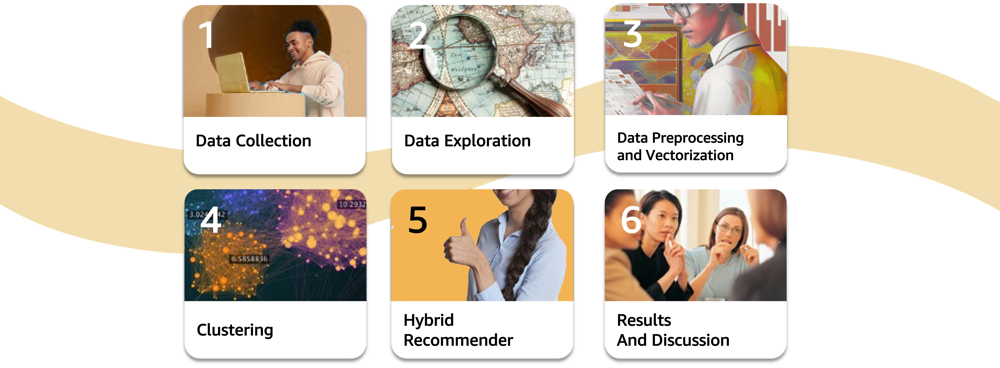

<left><span style="font-size:14px"><b>Figure 1. </b>Methodology</span></left>

<table >
    <tr style="color:#ffffff; background-color:#131921">
        <th style="text-align: left">No.</th>
        <th style="text-align: left">Step</th>
        <th style="text-align: left">Description</th>
    </tr>
    <tr>
        <td style="text-align: left">1.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Data Collection</td>
        <td style="text-align: left">Collect publicly available user review datasets from Amazon focusing on specific categories such as Home, Home Improvement, Furniture, and Major Appliances. Then store the collected data in an SQL database.</td>
    </tr>
    <tr>
        <td style="text-align: left">2.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Data Exploration</td>
        <td style="text-align: left">Prepare and clean the collected dataset to ensure its quality and suitability for further analysis. Perform EDA to explore and understand the relationships between the features, identify any trends/patterns, and provide insights regarding the Amazon reviews dataset.</td>
    </tr>
    <tr>
        <td style="text-align: left">3.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Data Preprocessing and Vectorization</td>
        <td style="text-align: left">Perform further preprocessing such as data validation, removal of stopwords, text lemmatization, and TF-IDF Vectorization to ensure that the data that will be used in the custom hybrid recommender system are of high quality and relevance with enough consideration for the computational complexity of the final and pruned dataset that will be used.</td>
    </tr>
    <tr>
        <td style="text-align: left">4.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Clustering</td>
        <td style="text-align: left">Apply K-means clustering algorithm to group product titles based on their similarities. Use internal validation criteria as well as visual and qualitative assessments of the resulting clusters in finding the optimal K or clusters. Interpret the meaning, significance, and relevance of each cluster and provide insights regarding the clusters formed. </td>
    </tr>
    <tr>
        <td style="text-align: left">5.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Hybrid Recommender</td>
        <td style="text-align: left">Create a recommendation pipeline of a Custom Hybrid Recommendation System that leverages multiple models such as Frequent-Itemset Mining (FIM), Content-Based  Recommender System, and Popularity-Based Recommender System using product titles and ratings as inputs. </td>
    </tr>
    <tr>
        <td style="text-align: left">6.</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Results and Discussion</td>
        <td style="text-align: left">Based on the created Custom Hybrid Recommendation System algorithm, provide demonstrations of the results of each recommendation pipeline. Then summarize the results, benefits, disadvantages, recommendations, and conclusion. </td>
    </tr>
</table>

<left><span style="font-size:14px"><b>Table 1. </b>Methodology Details</span></left>

[Back to TOC](#TContents)

<a id='Collection'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">IV. DATA COLLECTION</h1>

The data collection section involves three key steps:
1. Identifying the data source;
1. Describing the data; and
1. Collecting and storing the data into an SQL database.

<h2 style="color:#ff9a00">A. Data Source</h2>

The team used four (4) datasets from the Amazon Customer Review dataset made available to the team via the jojie-collected public datasets (directory: /mnt/data/public/amazon-reviews) of the Asian Institute of Management (AIM). 

The team chose the datasets based on categories that are related to 'Home' products, which the team determined to be: 
1. **Home** (directory: `/mnt/data/public/amazon-reviews/amazon_reviews_us_Home_v1_00.tsv.gz`)
2. **Home Improvement** (directory: `/mnt/data/public/amazon-reviews/amazon_reviews_us_Home_Improvement_v1_00.tsv.gz`)
3. **Furniture** (directory: `/mnt/data/public/amazon-reviews/amazon_reviews_us_Furniture_v1_00.tsv.gz`)
4. **Major Appliances** (directory: `/mnt/data/public/amazon-reviews/amazon_reviews_us_Major_Appliances_v1_00.tsv.gz`) 

The datasets are in a Tab Separated Values (tsv.gz) file format and were collected and uploaded into an SQL database. After collecting and preprocessing the data, the team was able to gather and use 9,735,040 reviews (rows) and 15 base features (columns) before transformation.

<h2 style="color:#ff9a00">B. Data Description</h2>

The following features were used and considered relevant for this report:

<table >
    <tr style="color:#ffffff; background-color:#131921">
        <th style="text-align: left">Feature Name</th>
        <th style="text-align: left">Feature Description</th>
        <th style="text-align: left">Data Type</th>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">customer_id</td>
        <td style="text-align: left">Unique ID of the customer.</td>
        <td style="text-align: left">integer</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">product_id</td>
        <td style="text-align: left">Unique ID of the product.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">product_title</td>
        <td style="text-align: left">Title of the product.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">product_category</td>
        <td style="text-align: left">Category of the products, which are Home, Home Improvement, Furniture, and Major Appliances.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">review_id</td>
        <td style="text-align: left">Unique ID of the review entry.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">review_headline</td>
        <td style="text-align: left">Subject or headline of the customer review.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">review_body</td>
        <td style="text-align: left">Testimonial or body of the customer review.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">review_date</td>
        <td style="text-align: left">Date when the review was published.</td>
        <td style="text-align: left">date</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">star_rating</td>
        <td style="text-align: left">Star ratings of the customers from 1 star to 5 stars, 1 being the lowest and 5 being the highest.</td>
        <td style="text-align: left">integer</td>
    </tr>
</table>

<left><span style="font-size:14px"><b>Table 2. </b>Data Description of Features Selected</span></left>

<h2 style="color:#ff9a00">C. Data Collection and Database Creation</h2>

To start processing the dataset, the team executed the following codes:

```python
# Gets the filepaths of the four shortlisted categories in the amazon dataset
f_paths = db_get_files()
# Creates a database based on the given categories and filepaths
db_create(f_paths)
```

In [14]:
# # Get chosen categories' filepaths
# f_paths = db_get_files()
# # Run Database Creation Function
# db_create(f_paths)

[Back to TOC](#TContents)

<a id='Exploration'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">V. DATA EXPLORATION</h1>

This section involves preparing and cleaning the collected dataset to ensure its quality and suitability for further analysis, followed by performing exploratory data analysis (EDA) to understand the relationships between the features, identify trends and patterns, and gain insights into the Amazon reviews dataset.

<h2 style="color:#ff9a00">A. Data Cleaning</h2>

The team only focused on the products and reviews data, thus the following features were dropped which are deemed not necessary in the study: 

<table >
    <tr style="color:#ffffff; background-color:#131921">
        <th style="text-align: left">Feature Name</th>
        <th style="text-align: left">Feature Description</th>
        <th style="text-align: left">Data Type</th>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">marketplace</td>
        <td style="text-align: left">Country of origin of the transactions (US only).</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">product_parent</td>
        <td style="text-align: left">Product Parent Codes.</td>
        <td style="text-align: left">integer</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">helpful_votes</td>
        <td style="text-align: left">Users vote if the review is helpful or not.</td>
        <td style="text-align: left">float</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">total_votes</td>
        <td style="text-align: left">Total number of votes per review.</td>
        <td style="text-align: left">float</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">vine*</td>
        <td style="text-align: left">Y or N values.</td>
        <td style="text-align: left">text</td>
    </tr>
    <tr>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">verified_purchase**</td>
        <td style="text-align: left">Y or N values.</td>
        <td style="text-align: left">text</td>
    </tr>
</table>

<left><span style="font-size:14px"><b>Table 3. </b>Data Description of Features Dropped</span></left>

**Notes:**

\* This pertains to Amazon's internal service program called **Amazon Vine** which is a service that selects the most insightful reviewers in the Amazon store to serve as Vine Voices. **Yes** may mean that the review is from the special internal service, and **No** if not. 

\*\* The team has no information if a 'verified_purchase' means whether it is a purchase that happened or not, or is it a purchase that is confirmed to be bought by the right customer with the right product. 

<h2 style="color:#ff9a00">B. Exploratory Data Analysis (EDA)</h2>

To perform the EDA, the team used and imported the original and unprocessed Amazon reviews dataset to obtain a broad overview of the dataset before any data pruning or feature selection is performed:

In [15]:
# Load amazon_df
amazon_df = load_full_df()

<h3 style="color:#222f3e">B1. Treat missing values</h3>

In [16]:
preview_df(amazon_df, display_df=False)

Number of Data Points: 9735040

Number of Features: 9

Number of Nulls: 1229

Count of missing values:


review_date           0
review_id             0
review_headline      55
review_body         820
customer_id         213
product_id          213
star_rating         213
product_title       354
product_category    213
dtype: int64

Considering that the missing data pertain to features that cannot be assumed such as reviews, customer_id, star_rating, and all product-related attributes, the team decided to drop those missing values.

In [17]:
amazon_df = amazon_df.dropna(axis=0)

<h3 style="color:#222f3e">B2. Display data types and statistics</h3>

The updated statistics and description of the data are now as follows:

In [18]:
preview_df(amazon_df, display_df=True)

Number of Data Points: 9733811

Number of Features: 9

Number of Nulls: 0

First three rows of the df:



,review_date,review_id,review_headline,review_body,customer_id,product_id,star_rating,product_title,product_category
0,2015-08-31,R203HPW78Z7N4K,"If you need a new stove, this is a winner.",What a great stove. What a wonderful replacement for my sort of antique. Enjoy it every day.,16199106.0,B0067WNSZY,5,"FGGF3032MW Gallery Series 30"" Wide Freestanding Gas Range 5 Sealed Burners Easy Temperature Probe Express-Select Controls One-Touch Self Clean:",Major Appliances
1,2015-08-31,R2EAIGVLEALSP3,Five Stars,worked great,16374060.0,B002QSXK60,5,Best Hand Clothes Wringer,Major Appliances
2,2015-08-31,R1K1CD73HHLILA,Fast Shipping,Part exactly what I needed. Saved by purchasing myself.,15322085.0,B00EC452R6,5,Supco SET184 Thermal Cutoff Kit,Major Appliances



Summary statistics for numerical columns:



,customer_id
count,9.733811e+06
mean,2.814895e+07
std,1.528985e+07
min,1.000600e+04
25%,1.475971e+07
50%,2.706626e+07
75%,4.251929e+07
max,5.309658e+07


After dropping the null values, the remaining rows and columns are equal to **9,733,811** and **9**, respectively. The cleaned dataframe will then be used to analyze and plot the distribution of the relevant columns before proceeding to the actual clustering and recommendation portion of this report.

<h3 style="color:#222f3e">B3. Plot distribution of product_categories</h3>

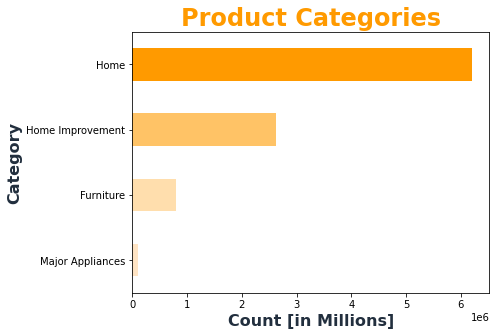

In [19]:
plot_dist_prodcat(amazon_df)

<left><span style="font-size:14px"><b>Figure 2. </b>Plot: Distribution of product categories</span></left>

**Insights**: 

The plot demonstrates the immense potential for growth in the ***Home Improvement, Furniture,*** and ***Major Appliances*** categories that any company can capitalize on.

<h3 style="color:#222f3e">B4. Plot distribution of star_ratings</h3>

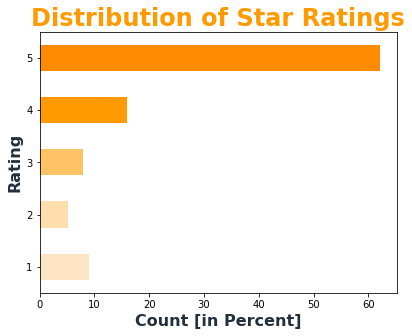

In [20]:
plot_dist_ratings(amazon_df)

<left><span style="font-size:14px"><b>Figure 3. </b>Plot: Distribution of star ratings</span></left>

**Insights**: 

Majority of the products rated are 4 stars or higher. This means that most customers are satisfied with the quality of products offered by Amazon, and suggests that it is possible to use popularity as a fallback feature in our recommender system.

<h3 style="color:#222f3e">B5. Plot trend of reviews per year</h3>

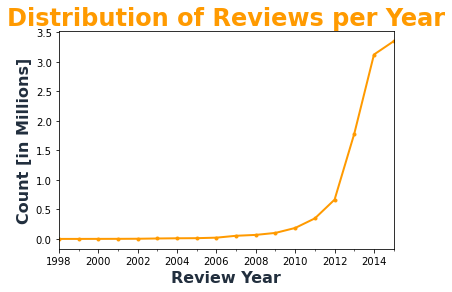

In [21]:
plot_reviews_per_year(amazon_df)

<left><span style="font-size:14px"><b>Figure 4. </b>Plot: Trend of Reviews per Year</span></left>

**Insights**: 

The number of online reviews skyrocketed starting 2012. Extracting information from this crowd-sourced knowledge can be used to make informed decisions and improve strategies.

<h3 style="color:#222f3e">B6. Plot distribution of average ratings of top 10 most reviewed products</h3>

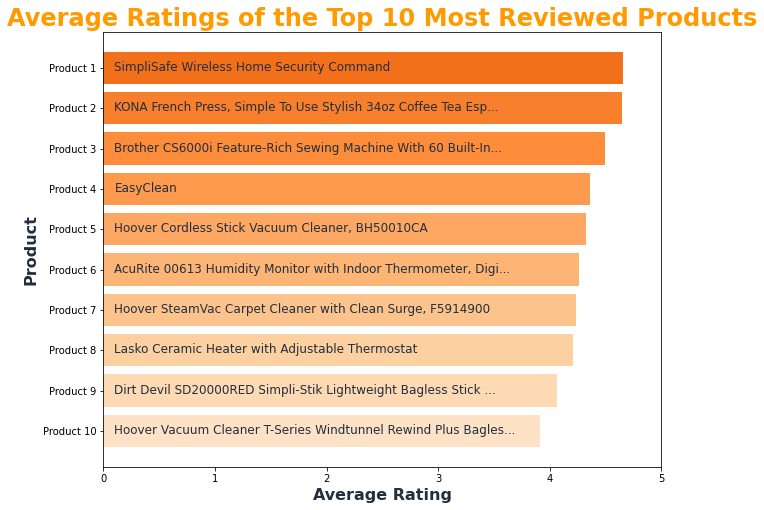

In [22]:
plot_10_most_reviewed(amazon_df)

<left><span style="font-size:14px"><b>Figure 5. </b>Plot: Average Ratings of the 10 Most Reviewed Products</span></left>



**Insights**: 

A simple query illustrated in ***Figure 5: Plot: Average Ratings of the 10 Most Reviewed Products*** demonstrates Amazon's wide variety merchandising strategy. The success of such strategy depends on the retailer's ability to effectively manage its inventory and supply chain, as well as to provide a positive customer experience that helps customers navigate the vast selection of products.

[Back to TOC](#TContents)

<a id='Vectorization'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">VI. DATA PREPROCESSING AND VECTORIZATION</h1>

In this section, the team performed several steps to further refine and prepare the data for analysis. Such preprocessing steps include data validation, removal of stopwords, text lemmatization, and TF-IDF Vectorization to ensure that the data that will be used in the creation of a custom hybrid recommender system is of high quality and relevance. The steps performed are discussed in detail as follows: 1. Lemmatized and vectorized product titles for clustering and saved it to `product_titles` variable.
* Added product-specific stopwords to the standard NLTK English stopwords, as these stopwords may be irrelevant or redundant in the context of the data being processed. This additional step helped reduce noise and improve the quality and relevance of the data for the team's analysis.
* Several iterations of vectorization parameters were attempted. Words with frequencies between 0.5% to 10% were used because such settings provide the most relevant features to use for clustering given the sparsity of the resulting TF-IDF matrix while simultaneously keeping the computational complexity manageable.<br>

    - **`ngram_range=(1, 1)`**: Only unigrams were considered. <br>
    - **`max_df=0.10`**: Included only words that show up in NO more than 10% of the documents.<br>
    - **`min_df=0.005`**: Included only words that show up in AT LEAST 0.5% of the documents (effectively filtering out unique and infrequent words.)<br>
    - **`token_pattern=r'[a-z]{2,}'`**: Considered only tokens or words that are in lowercase and with at least two characters.<br>
    - **`stop_words=stop_words`**: Excluded English and additional stopwords mentioned in the previous step.<br>
    - **`max_features=None`**: Did not set a limit for the maximum number of features to be used.<br>


* Lemmatized and vectorized `product_titles` using the results in the previous steps to create the `product_profiles` variable. This variable is a vector representation of the characteristics of the products based on the words used in their product titles. The resulting product profiles will be used as inputs for the subsequent analysis and modeling steps.

In [23]:
# Get all available Products
product_titles = get_products()

In [24]:
# Define other drop words
drop_words = ['let', 'one', 'two', 'three', 'four', 'five', 'star', 'product',
              'year', 'inch', 'warranty', 'x', 'recommend', 'well', 'great',
              'size', 'expected', 'best', 'excellent', 'inch', 'pack', 'px',
              'pk', 'ct', 'quality', 'recommend', 'item', 'wonderful', 'size',
              'must', 'ordered', 'order', 'wanted', 'want', 'super', 'star',
              'purchase', 'useful', 'arrived', 'arrive', 'awesome', 'super',
              'fantastic', 'quite', 'definitely', 'worked', 'pleased', 'sure',
              'know', 'every', 'second', 'purchased', 'lb', 'pound', 'inch',
              'cleaner', 'ounce', 'oz', 'pack', 'product', 'quality']

drop_list = ['white', 'black', 'blue', 'red', 'home', 'set', 'piece', 'color']

# Instatiate stop words
stop_words = list(set(
    stopwords.words('english') +
    list(STOPWORDS) +
    drop_words
))

# Define params for tf-idf vectorization
new_params = dict(
    ngram_range=(1, 1),
    token_pattern=r'[a-z]{2,}',
    stop_words=stop_words,
    max_df=0.10,
    min_df=0.005,
    max_features=None
)

# Get product profiles
product_profiles = cl_get_features(product_titles, new_params)

In [25]:
# Display product profiles matrix
print(f'Product profiles:')
product_profiles

Product profiles:


,accent,acrylic,adjustable,air,american,antique,area,art,baby,back,...,wedding,white,wide,window,wire,wood,wooden,yard,yarn,yellow
product_id,,,,,,,,,,,,,,,,,,,,,
B0067WNSZY,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.540678,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B002QSXK60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00EC452R6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00MVVIF2G,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00IY7BNUW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B00004TQ7K,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00004SAC6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00004OCLP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<left><span style="font-size:14px"><b>Table 4. </b>Product Profiles Matrix</span></left>

[Back to TOC](#TContents)

<a id='Results'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">VII. RESULTS AND DISCUSSION</h1>

In this section, the team initially explored using reviews as the main feature for clustering and recommending. However, it did not produce good results. As a result, the team opted to use product titles instead. Results of which are discussed in detail in the following sections.

Overall, this step involves clustering, interpretation of clustering results, and the actual creation and use of the hybrid recommender system. 

<a id='Clustering'></a>
<h2 style="color:#ff9a00">A. Clustering</h2>

In this section, the team's initial approach was to cluster the products based on their reviews on pruned data (only products which were reviewed at least 610 times). However, this resulted to clusters which are reminiscent of the product categories used in the data and would not add much value to the study. Therefore, the team performed clustering based on product titles instead and considered all 1.5M+ unique products. 

In [26]:
# Get cluster labels for each k in range
cluster_dict, cluster_inertias = cl_cluster_range(product_profiles, drop_list)

  0%|          | 0/9 [00:00<?, ?it/s]

Due to the large number of rows to consider, it was not practical to calculate internal validation criteria for different clustering algorithms, because most of it rely on pairwise distance calculations, which would be intractable for the number of products that the team considered. Hence, the team decided to rely on the `inertia` attribute of the **KMeans Clustering algorithm** which refers to the sum of squared errors of each cluster member to its respective cluster center. For interpretability, the team only selected K for up to 10 and used elbow method of the reconstruction error or inertia (Frobenius norm of the matrix difference, between the training data and the reconstructed data from the fitted model) as a basis for finding the optimal K.

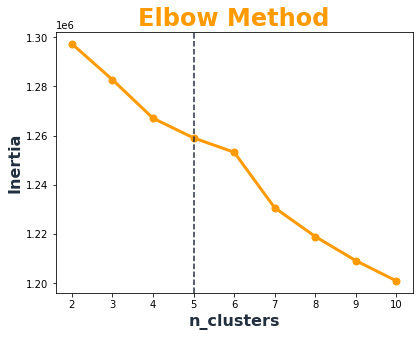

In [27]:
cl_plot_inertias(cluster_inertias)

<left><span style="font-size:14px"><b>Figure 6. </b>Plot: Elbow Method for finding Optimal K Clusters</span></left>

By plotting the respective inertias of possible clusters for $k=2,3,\dots,10$, the team identified an elbow at $k=5$. However, it was difficult to interpret. Therefore, the team manually inspected the resulting word clouds for $k=2,3,\dots,10$ and identified which would provide the most interpretable clustering results. Despite imbalances in the proportion of clustering, even a cluster size of $1\%$ corresponds to at least $20,000$ unique products. Due to this, the team believes that in the context of this specific use case, although validation criteria suggests a more parsimonious clustering, the team chose $k=8$ as it corresponds to the most interpretable clustering.

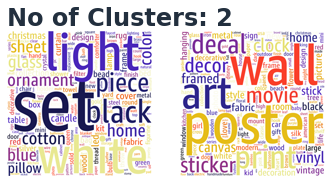

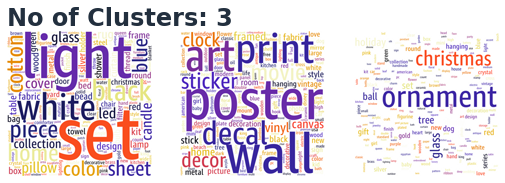

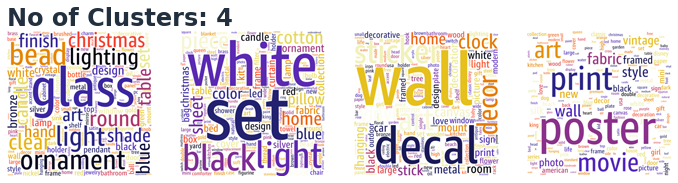

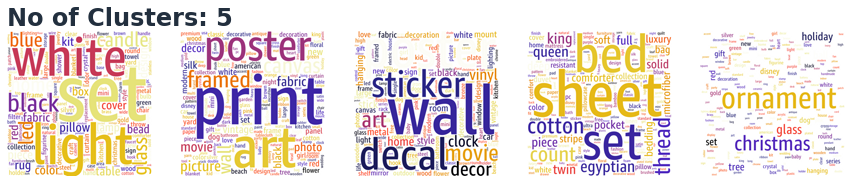

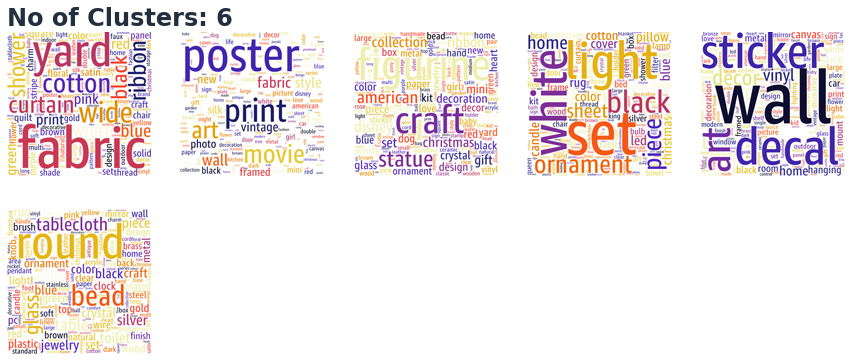

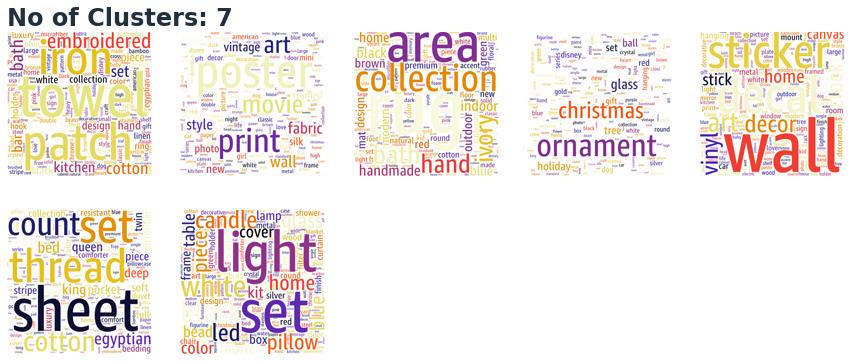

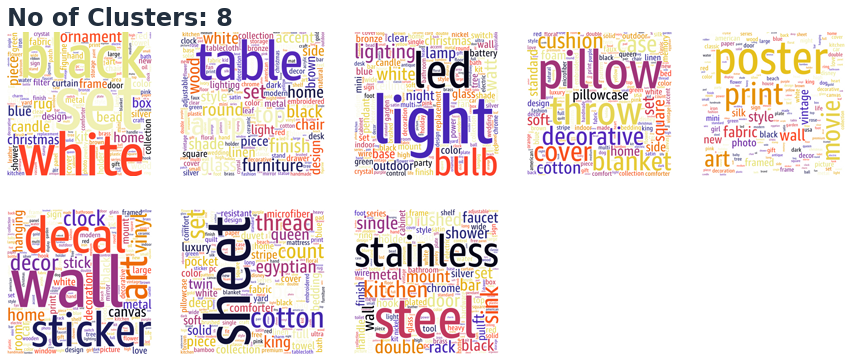

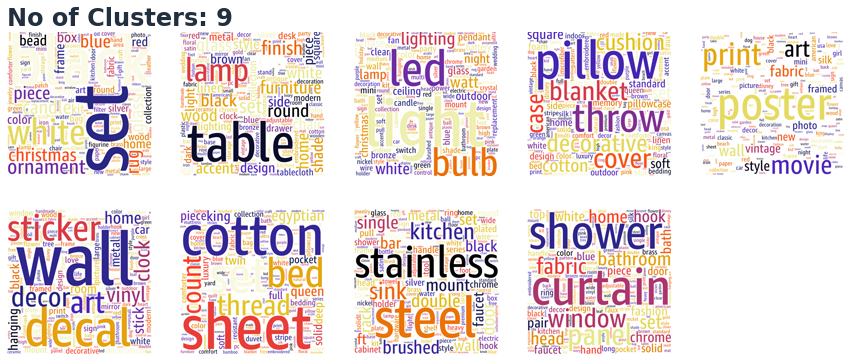

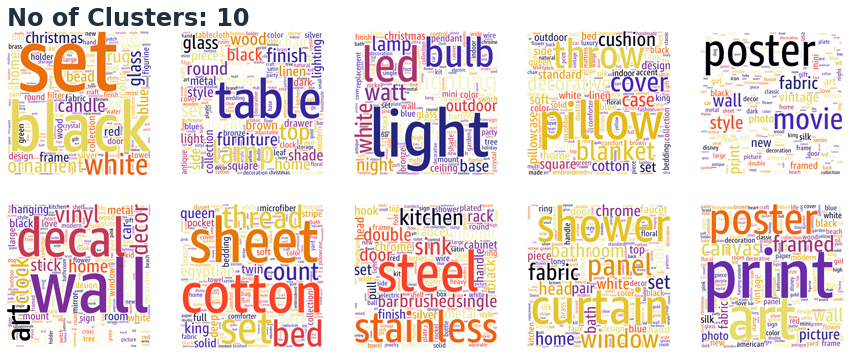

In [28]:
# Plot all wordclouds for each k-clustering
wc = WordCloud(
    font_path='AmazonEmberCdRC_Rg.ttf',
    width=800, height=800,
    background_color='white',
    colormap='CMRmap_r',
    stopwords=stop_words,
    random_state=1337,
)
cl_plot_all(cluster_dict, product_profiles, wc)

<left><span style="font-size:14px"><b>Figure 7. </b>WordCloud of each cluster for different values of K</span></left>

After individually assessing the top words per cluster of $k=8$, our team arrived at the following appropriate labels for each cluster:

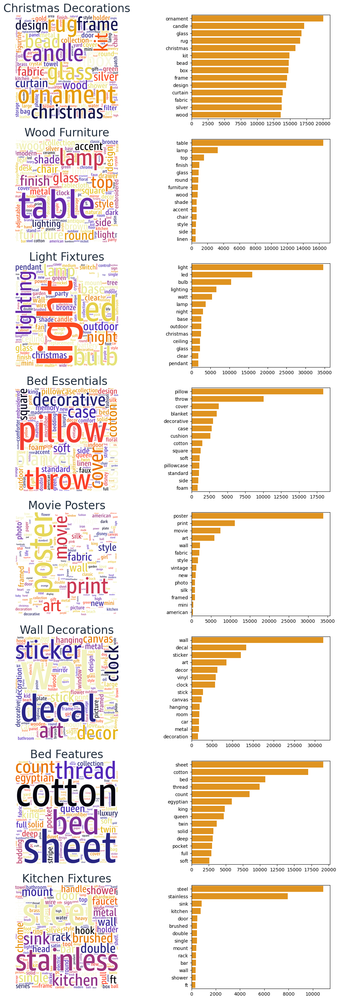

In [29]:
# Label clusters for n_clusters = 8
n = 8
cluster_names = ['Christmas Decorations',
                 'Wood Furniture',
                 'Light Fixtures',
                 'Bed Essentials',
                 'Movie Posters',
                 'Wall Decorations', 
                 'Bed Features',
                 'Kitchen Fixtures']
cl_plot_cluster(cluster_dict,
                product_profiles.drop(drop_list, axis=1),
                n,
                wc,
                cluster_names=cluster_names)

<left><span style="font-size:14px"><b>Figure 8. </b>WordCloud of each cluster for K=8 and the corresponding top words per cluster</span></left>

<a id='InterpretClusters'></a>
<h2 style="color:#ff9a00">B. Interpretation of Clustering Results</h2>

In determining and assigning the cluster labels appropriate for each class obtained using KMeans Clustering Method, the team considered the following steps:

1. Identify the most prominent and dominant features or words that represent each cluster.
1. Compare such most prominent features or words between different clusters and identify differentiating factors that provides how well the clusters are separated from each other.
1. Evaluate the significance of each characteristics by determining the top features or words of each cluster.

Based on the above steps, the team was able to finalize the following clustering results:

<table >
    <tr style="color:#ffffff; background-color:#131921">
        <th style="text-align: left">Cluster Number</th>
        <th style="text-align: left">Cluster Label</th>
        <th style="text-align: left">Characteristics</th>
    </tr>
    <tr>
        <td style="text-align: left">1</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Christmas Decorations</td>
        <td style="text-align: left">characterized mainly by products related to Christmas decor and home accessories such as ornaments, candles, rugs, and fabric decorations. The products in this cluster may feature glass, bead, silver, wood, or frame accents, and various designs related to Christmas. Additionally, this cluster may include Christmas decoration kits that contain various ornaments and decorations. Overall, this cluster offers a range of unique and festive Christmas-themed decorations and accessories that may appeal to individuals looking to enhance their holiday decor.</td>
    </tr>
    <tr>
        <td style="text-align: left">2</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Wood Furniture</td>
        <td style="text-align: left">represented by products related to wooden furniture and home decor such as tables, chairs, and accent furniture. The products in this cluster may have different finishes, glass features, and styles, and may also include lamps with various shades. Additionally, some furniture products in this cluster may feature linen material. Overall, this cluster offers a range of stylish and elegant wooden furniture and home decor products that may appeal to homeowners or interior designers looking to incorporate wooden furniture into their homes.</td>
    </tr>
    <tr>
        <td style="text-align: left">3</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Light Fixtures</td>
        <td style="text-align: left">contains products related to lighting and light fixtures such as light bulbs, LED lights, lamps, night lights, outdoor lighting, and ceiling fixtures. The products in this cluster may vary in wattage and base style, and some may be made with clear materials like glass or plastic. Overall, this cluster offers a range of lighting options for different settings and purposes, and may appeal to homeowners and interior designers seeking stylish and functional lighting solutions.</td>
    </tr>
    <tr>
        <td style="text-align: left">4</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Bed Essentials</td>
        <td style="text-align: left">encompasses products that are associated with bedding and bedroom decor. This cluster includes pillow-related products, decorative items such as cushions and throw pillows, bed coverings like blankets and cotton sheets, and foam products that provide softness and comfort. Additionally, the cluster contains sets of matching products, including pillowcases and cushion covers, that are intended to coordinate with other bedding items.</td>
    </tr>
    <tr>
        <td style="text-align: left">5</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Movie Posters</td>
        <td style="text-align: left">encompasses products that are associated with movie posters and wall art. This cluster comprises items like posters, prints, and photos, including specific types of posters related to movies, art, vintage designs, and contemporary pieces. Additionally, the products in this cluster are intended to be used as wall decorations, as suggested by the presence of the words "wall" and "framed".</td>
    </tr>
    <tr>
        <td style="text-align: left">6</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Wall Decorations</td>
        <td style="text-align: left">contains products related to wall decor and home accessories such as wall decals, stickers, art, clocks, and hanging products. The products in this cluster may feature vinyl, metal, or decorative accents, and may be intended for different room settings or car decals. Overall, this cluster offers a range of unique and creative wall decor and home accessory options that may appeal to individuals looking to enhance their home decor.</td>
    </tr>
    <tr>
        <td style="text-align: left">7</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Bed Features</td>
        <td style="text-align: left">contains products related to bedding and bed features such as sheets, cotton, thread count, and pocket size. The products in this cluster may be available in different sizes such as twin, full, queen, and king, and may feature different solid colors. Additionally, some products in this cluster may be made of Egyptian cotton and may be marketed as soft with a high thread count. Overall, this cluster offers a range of high-quality bedding products that may appeal to individuals looking for soft and comfortable bedding with specific features.</td>
    </tr>
    <tr>
        <td style="text-align: left">8</td>
        <td style="text-align: left; font-weight: bold; color:#ff9a00;">Kitchen Fixtures</td>
        <td style="text-align: left">contains products related to kitchen fixtures and accessories such as sinks, racks, and mounts. The products in this cluster may be made of stainless steel and feature a brushed finish. Additionally, this cluster includes both single and double sinks, as well as wall-mounted kitchen fixtures like bars and shower heads. Overall, this cluster offers a range of stainless steel kitchen fixtures and accessories that may appeal to individuals looking for high-quality and stylish kitchen products.</td>
    </tr>
</table>

<left><span style="font-size:14px"><b>Table 5. </b>Clustering Results</span></left>

By clustering the products mentioned in ***Table 5: Clustering Results***, the team was able to fully understand the segmentation of the products and obtain an idea about the composition of the dataset. In particular, these results will be used to stratify the recommendations of the hybrid recommender system by product segment which will be demonstrated in the succeeding sections.

After clustering the products, the team proceeded to perform and create the hybrid recommender system.

<a id='Recommender'></a>
<h2 style="color:#ff9a00">C. Recommender System</h2>

In this section, the team created recommendation pipelines of a Custom Hybrid Recommendation System that leverages multiple models such as FIM, Content-Based Recommender System, and Popularity-Based Recommender System using product titles and ratings as inputs.

<h3 style="color:#222f3e">C1. FIM Hyperparameter Tuning</h3>

Before working on the final algorithm, the team experimented first with different values of the parameters, such as `customer_id` and resampled `review_date` as basis for transactions, to find the optimal combination that would yield the best results for FIM. 

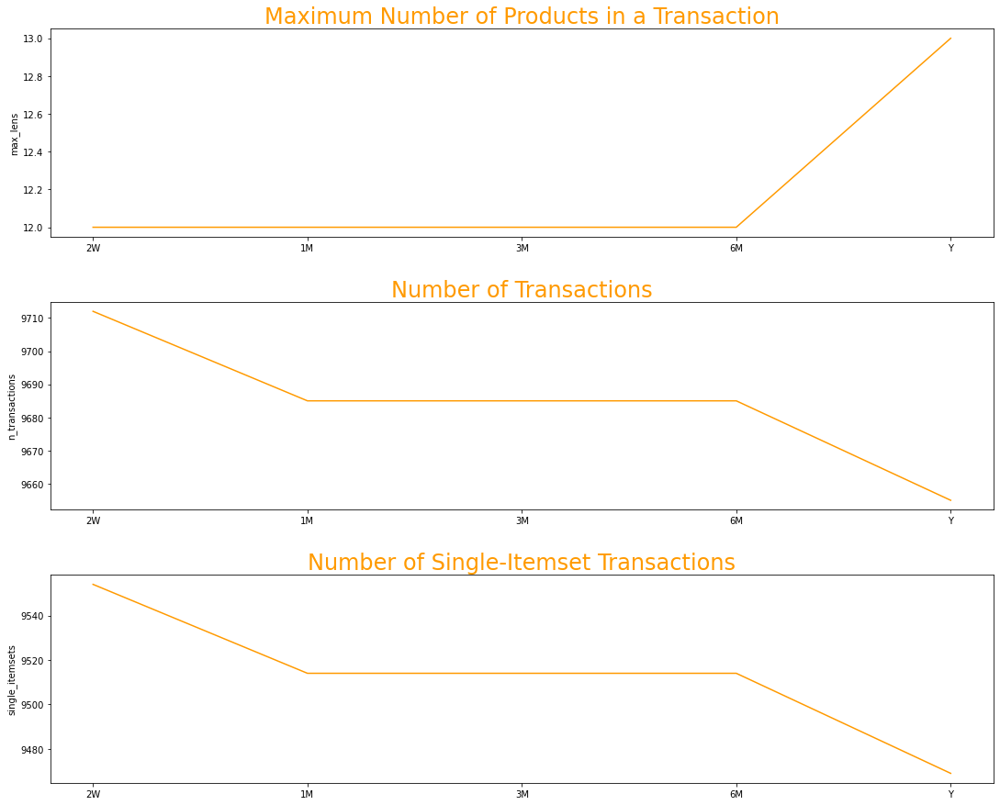

In [30]:
fim_df_raw = fim_get_amazon()
fim_df_res = fim_tune_period(fim_df_raw, n_reviews=10_000)
fim_plot_tuning(fim_df_res)

<left><span style="font-size:14px"><b>Figure 9. </b>FIM Hyperparameter Tuning Results</span></left>

Based on ***Figure 9: FIM Hyperparameter Tuning Results***, there is no significant effect in resampling `review_date`s, hence, the team decided to simply treat each unique `customer_id` as a transaction of liked products.

After clustering the products, the team then created a custom hybrid recommendation system, called **RecSys 360** that leverages multiple models using product titles and ratings as inputs. In the following steps, the team demonstrated the results of each recommendation pipeline to explain how **RecSys 360** works then summarized the advantages and disadvantages of this RecSys.

The **RecSys 360** Algorithm starts by initializing it with the following necessary databases:

1. FIM Algorithm
    * Transaction Database
    * FIM Rules with hyperparameters: `supp` & `conf`
1. Content-based Algorithm
    * Item Profiles
    * User Profiles
1. Popularity-based Algorithm
    * Weighted product/item ratings

<h3 style="color:#222f3e">C2. RecSys 360 Algorithm</h3>

To illustrate how the algorithm works, please refer to the ***Figure 10: RecSys 360 Algorithm***

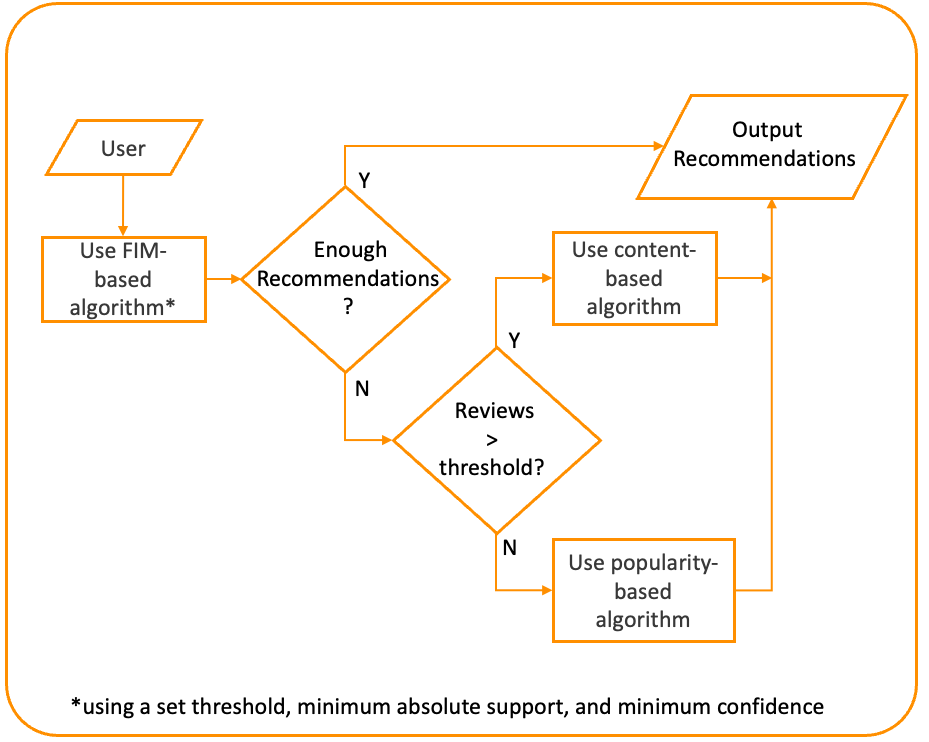

<left><span style="font-size:14px"><b>Figure 10. </b>RecSys 360 Algorithm</span></left>

To proceed with the demonstration part, the team initialized the RecSys360 class by using RecSys360 class and filling it with parameters pertaining to the following:

```Python
# Initialize the RecSys360 class
recsys360 = RecSys360(fim_df_raw, product_profiles, cluster_dict[8])
```

**PARAMETERS**:
* **FIM_df_raw**: Complete dataframe;
* **product_profiles**: design matrix of product titles; and
* **product_clusters**: clusters of each product based on the clustering results in ***Table 5. Clustering Results***

Then for the purposes of this report, the following are the set parameters that can be changed depending on the use case:
* **cust_thresh=62**: Customers who provided at least 62 reviews shall be considered in going through the content-based recommender pipeline if FIM-based outputs are not enough;
* **prod_thresh=610**: Only products with at least 610 reviews were considered (after taking into account the computational complexity of decreasing the threshold for the number of products);
* **supp=-5**: Only products with at least 5 absolute support are considered in the FIM-Based algorithm; and
* **conf=60**: Only products with confidence of at least 60% are considered in the FIM-Based algorithm.

In [31]:
# Initialize the RecSys360 class
recsys360 = RecSys360(fim_df_raw, product_profiles, cluster_dict[8])

<h3 style="color:#222f3e">C3. FIM-Based Recommender</h3>

After initializing the RecSys360 class, the following demonstrates the first pipeline where the input userID will go through FIM-Based Recommender pipeline and the FIM output recommendations is equal to `L` or the number of recommendations that the person who entered the query intends to see. 

By default, `L` = 5 recommendations.

To illustrate, use `user=52228204` and output five recommendations:

Recommended Items:
5 FIM-based items


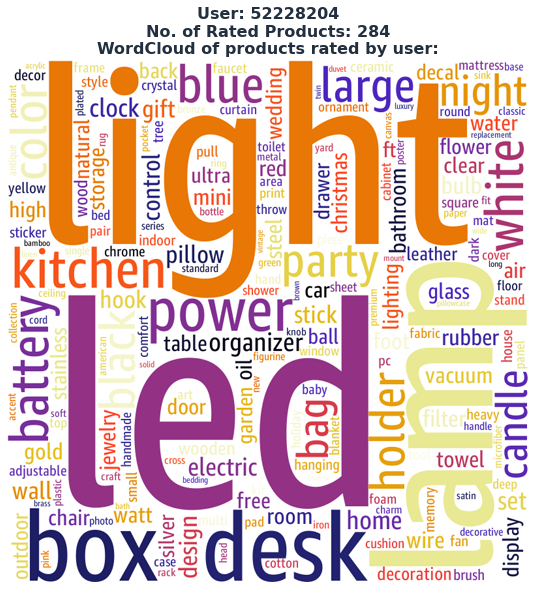

Figure 11. FIM-Based Recommender Demo
Recommendations:

1: G7 Power G7A191029 870 Lumen 9.5-watt 3000K E26 Base A19 LED Light Bulb, 4-Pack

2: Ivation 3 LED Automatic Motion-sensing Directional Night Light - Battery Powered Hallway Light with a Built in Motion and Light Sensor

3: Hipo Multipurpose 15+5 LED Emergency Power failure Light / Flashlight / Automatic Motion-sensing Night light - 3-in-1 Emergency Hallway Light with a built in Motion and light Sensor

4: Smart Weigh Digital Bathroom BMI Body Fat Weight Scale, Tempered Glass, 440 pounds, Black

5: Glass Top Jewelry Ring/Gem Jar Display Case


In [32]:
([print(f'\n{index+1}: {product_title}') for index, product_title
  in enumerate(recsys360.recommend(52228204,
                                   return_titles=True,
                                   print_dist=True, print_wc=True,
                                   fig_num=11, 
                                   fig_text='FIM-Based Recommender Demo'))]);

**Insights**:

In this report, the FIM technique was used to identify patterns in transactional data by analyzing the products reviewed by users and identifying frequently occurring sets of items, referred to as itemsets. These identified itemsets are then recommended to individual users based on their previous purchases and ratings of similar products.

In this case, the products recommended by the FIM-based algorithm for `user=52228204` were likely based on the products previously bought by the user containing words such as "light", "led", "lamp", "box", "desk", "blue", "large", "night", "power", and "organizer" among others, it's possible that the FIM algorithm identified frequent itemsets that contained these keywords and recommended the products that are usually bought along with those products (complementary products).

For example, the "Glass Top Jewelry Ring/Gem Jar Display Case" may have been recommended based on the keyword "organizer".

In summary, the FIM-based algorithm likely recommended these products because they were frequently purchased together by user who had also purchased products related to the given keywords in product titles.

<h3 style="color:#222f3e">C4. Content-Based Recommender</h3>

If the number of `L` or recommendations returned by FIM-Based recommender pipeline is not enough, **RecSys 360** then checks if the number of reviews provided by the customer is above the `cust_thresh` parameter, in this case, 62 reviews. If so, the Content-Based Recommender pipeline with be executed where it will fill the remaining recommendations lacking from FIM-Based pipeline.

To illustrate, use `user=20594005` and output five recommendations:

Recommended Items:
0 FIM-based items, 5 CB-based items


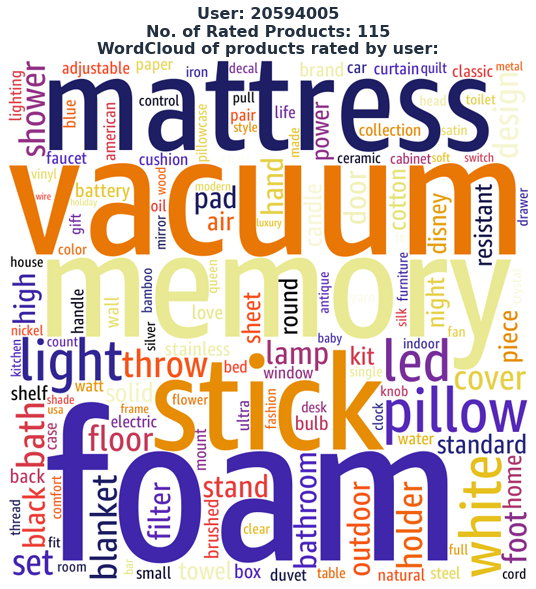

Figure 12. FIM + Content-Based Recommender Demo
Recommendations:

1: DynastyMattress- Therapeutic Deluxe 10" with Cool AirFlow HD Memory Foam Mattress with High Quality Visco-Elastic Memory Foam, with FREE Pillow!

2: DynastyMattress- Therapeutic Deluxe 10" with Cool AirFlow HD Memory Foam Mattress with High Quality Visco-Elastic Memory Foam, with FREE Pillow!

3: White Memory Foam U-Shaped Neck Pillow

4: Sleep Better Ultimate Memory Foam Mattress Topper with Velour Cover

5: Sleep Studio Sleep Joy Memory Foam Contour Pillows, Set of 2


In [33]:
([print(f'\n{index+1}: {product_title}') for index, product_title
  in enumerate(recsys360.recommend(20594005,
                                   return_titles=True,
                                   print_dist=True, print_wc=True, 
                                   fig_num=12, 
                                   fig_text='FIM + Content-Based Recommender Demo'))]);

**Insights:**

In line with how Content-based recommendations work, recommendations in this pipeline (aside from FIM-based recommendations) are based on the characteristics of the products that a user has previously bought and rated. In this case, the recommended products were likely chosen based on their similarity to the products that the user had previously bought and rated.

For example, the products recommended in this case, such as the DynastyMattress- Therapeutic Deluxe 10" with Cool AirFlow HD Memory Foam Mattress, Sleep Better Ultimate Memory Foam Mattress Topper, and Sleep Studio Sleep Joy Memory Foam Contour Pillows, all contain memory foam, which is a characteristic shared with some of the previous products bought by the user.

Additionally, the White Memory Foam U-Shaped Neck Pillow is likely recommended due to its similarity to the other pillows that the user has previously purchased. The fact that the DynastyMattress- Therapeutic Deluxe 10" with Cool AirFlow HD Memory Foam Mattress appears twice in the recommendations may be because the same item is being sold by different sellers with different product IDs but same product titles.

In summary, the content-based recommendation in this case likely recommended these products based on their similarity to the user's previous purchases of products such as mattresses, pillows, and memory foam items.

<h3 style="color:#222f3e">C5. Popularity-Based Recommender</h3>

Finally, if the number of L or recommendations returned by FIM-Based recommender pipeline is not enough, and the number of reviews provided by the customer is equal to or lower than the `cust_thresh` parameter, the Popularity-Based Recommender pipeline with be executed where it will fill the remaining recommendations lacking from FIM-Based pipeline.

To illustrate, use `user=10032` and output five recommendations:

In [34]:
([print(f'\n{index+1}: {product_title}') for index, product_title
  in enumerate(recsys360.recommend(10032,
                                   return_titles=True,
                                   print_dist=True, print_wc=True))]);

Recommended Items:
0 FIM-based items, 5 Popularity-based items

1: Quoizel CDY1508 Cody 1 Light Industrial Mini Pendant,

2: Pretty Electric Guitar Amber Swirl Table Lamp -1356

3: Ozzy Osbourne - Blizzard of Ozz LP Rock Clock

4: Bliss Throw Color: Sage

5: Star Wars Episode 1 Movie Teaser Poster Puzzle


**Insights**:

The Popularity-Based recommender pipeline recommends products based on the products with the highest weighted rating $r_w$ defined by

\begin{align}
    r_{w} = \sum_{r=1}^5 \frac{r n_r}{n}
\end{align}
where $r$ is the rating, $n_r$ is the number of times that a product was rated as $r$, and $n$ is the total number of reviews for a product.

The resulting recommendations are then stratified by the clusters mentioned in ***Table 5: Clustering Results***. This ensures that the recommendations are diverse to encourage customers to explore the product catalog.

[Back to TOC](#TContents)

<a id='Recommendation'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">VIII. RECOMMENDATION</h1>

<a id='Limitations'></a>
<h2 style="color:#ff9a00">A. Limitations of the Study</h2>

It is important to acknowledge and understand the assumptions and limitations that may impact the performance and reliability of a recommendation system. The following list outlines some of the assumptions and limitations of the dataset used in this analysis:
* The dataset had no metadata on users and is limited to user ratings and reviews only, no data on view history, or add-to-cart data.
* The data on products is limited only to its product title and product ID, but no explicit information on its brand and price.
* During the assignment of cluster labels, in cases where there is no discernible theme, the team manually used the top-ranking features (proxy for top predictor) as a basis for labeling the cluster.

<a id='Recommendation2'></a>
<h2 style="color:#ff9a00">B. Recommendation</h2>

To further maximize the benefits of the **RecSys 360**, businesses could perform the following:

- Instead of popular products, a business can put the products that they want to promote in place of the products in Popularity-based pipeline. They can even charge other vendors for a fee to use that pipeline for advertising products.
- Encourage users to rate more products by providing incentives such as discounts or loyalty points to increase the user reviews database.
- Increase threshold values as the user reviews database increase to provide more personalized recommendations with content-based recommender system pipeline.
- Collect and consider adding features such as demographic and time data to increase relevance of recommendations even for users with few ratings.
- Use the system to optimize marketing strategies, product pricing, and product development/design.
- Continuously update and refine the recommender system based on user reviews by considering future works in the following slide.

<a id='FutureWork'></a>
<h2 style="color:#ff9a00">C. Future Work</h2>

As with any recommender systems, there is always room for improvement and development. The following list outlines some potential future work that could be undertaken to enhance the performance and functionality of the recommendation system:

- **Utilize implicit feedback**: to increase the relevance of recommendations to users that created no to few review ratings.
- **Real-time updates, online and active learning**: Automatically update the database using online learning techniques to provide real-time updates whenever a new user review is saved in the system. 
- **Deep learning techniques**: Utilize deep learning techniques such as neural networks and deep belief networks to capture more complex patterns in product titles and text analyses, and to improve the efficiency of the recommendation algorithm.
- **Multimodal data**: Incorporate additional types of data, such as image and video data, to provide more diverse and engaging recommendations, if possible.

[Back to TOC](#TContents)

<a id='Conclusion'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">IX. CONCLUSION</h1>

In creating this report, the team aimed to create a versatile recommender system that can process and utilize extremely sparse data. To attain such objective, it is necessary to integrate and leverage diverse methods and techniques from various recommender systems such as `Frequent Itemset Mining`, `Content-Based Recommender System`, `Popularity-Based Recommender System`. 

To understand the prevailing characteristics of product_titles, the team explored K-means clustering method which resulted to the following eight different clusters: 
- `Christmas Decorations`, `Wood Furniture`, `Light Fixture`, `Bed Essentials`, `Movie Posters`, `Wall Decorations`, `Bed Features`, `Kitchen Fixtures`.

Eventually, the team developed a custom hybrid recommender system and named it **RecSys 360**. Depending on the given parameters, which are the `L` (number of recommendations to return), `threshold`, `min_abs_supp` and `min_conf`, the **RecSys 360** works by recommending products to a user by going through one of the following pipelines: 

- Use **FIM-based recommender system**:
    - If the output of FIM is equal to `L`, return all the FIM output. (**FIM-Based Recommendation**)
    - If the output of FIM is less than `L`, return all the FIM output and get the remaining output from **Content-Based Recommender System** if the number of products reviewed by the customer is above the `threshold`. (**FIM + Content-Based Recommendation**)
    - Otherwise, use the **Popularity-based Recommender System** to get the remaining output. (**FIM + Popularity-Based Recommendation**)



The assumptions and limitations of the dataset were acknowledged, and future work was identified to enhance the performance of the recommendation system. 

Overall, by recommending products using **RecSys 360**, the team has successfully created a versatile, custom hybrid recommender system that can handle even extremely sparse user-review dataset and can be a valuable tool to improve user experience, increase revenue, and can serve as a foundation for further research in the field of recommendation systems.

<a id='References'></a>
<h1 style="color:#ffffff; background-color:#222f3e; border: 1px solid #ffffff; padding: 10px 0;">REFERENCES</h1>

<a name='Intro'></a>[1] Banik, R. (2018). Hands-On Recommendation Systems with Python: Start building powerful and personalized, recommendation engines with Python. Packt Publishing.

[Back to TOC](#TContents)

***
**END**